In [53]:
# This notebook analyzes a dataset from an employer tracking employee retention over time.

import pandas as pd
import seaborn as sns
from dataprep.eda import plot, plot_correlation, plot_missing
import numpy as np
import matplotlib.pyplot as plt



# Data Import and Cleaning

In [54]:
# read data
path= 'WA_Fn-UseC_-HR-Employee-Attrition.csv'

raw_data = pd.read_csv(path)

print(raw_data.shape)
#print first few rows
raw_data.head()

(1470, 35)


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [55]:
raw_data.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [56]:
raw_data.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [57]:
# processed data will be called "hr_data"
hr_data=raw_data

##  Outliers

Filter to rows with atleast one outlier, calssified as having a z score >3.  The z-score measures how many standard deviations a value is from the mean.  There are 80 rows with an outlier in atleast one column, no rows have an outlier in every row.  The extreme values are interpreted as extreme but likely correct.  During model specification it would be prudent to evaluate the sentivity of model health to the inclusion of outliers. 

In [120]:

# Check for outliers
numeric_data = hr_data.select_dtypes(include='number')

hr_outliers=numeric_data[(np.abs(stats.zscore(numeric_data)) > 3).any(axis=1)].sort_values(by=['Age'], inplace=False)



#outlier dimensions
print(hr_outliers.shape)

# see first few outliers
hr_outliers.head()

(83, 20)


,Age,DailyRate,DistanceFromHome,EmployeeCount,EmployeeNumber,HourlyRate,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,StandardHours,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
635,35,607,9,1,880,66,3,10685,23457,1,20,4,80,17,2,3,17,14,5,15
64,36,1223,8,1,83,59,3,10096,8202,1,13,3,80,17,2,3,17,14,12,8
752,36,885,16,1,1042,43,1,2743,8269,1,16,3,80,18,1,3,17,13,15,14
386,37,1107,14,1,515,95,1,3034,26914,1,12,3,80,18,2,2,18,7,12,17
1430,38,201,10,1,2015,99,3,13206,3376,3,12,3,80,20,3,3,18,16,1,11


In [109]:
numeric_data.head()

,Age,DailyRate,DistanceFromHome,EmployeeCount,EmployeeNumber,HourlyRate,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,StandardHours,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,1,1,94,4,5993,19479,8,11,3,80,8,0,1,6,4,0,5
1,49,279,8,1,2,61,2,5130,24907,1,23,4,80,10,3,3,10,7,1,7
2,37,1373,2,1,4,92,3,2090,2396,6,15,3,80,7,3,3,0,0,0,0
3,33,1392,3,1,5,56,3,2909,23159,1,11,3,80,8,3,3,8,7,3,0
4,27,591,2,1,7,40,2,3468,16632,9,12,3,80,6,3,3,2,2,2,2


## Change Column Types

In [73]:
# Change select columns to categorical from integer.
# The following variables are currently continuous but should be converted to objects or ordinal character types.

cols = ["Education", "EnvironmentSatisfaction", "JobInvolvement", "JobLevel", "RelationshipSatisfaction", "StockOptionLevel"]
hr_data[cols] = hr_data[cols].astype('category')

In [74]:
hr_data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [78]:
#check categorical levels for completeness and spelling
categorical = hr_data.select_dtypes(exclude=['int64'])



# check that the unique values in each column appear legitimate
for col in categorical:
    print(categorical[col].unique())

# check counts and unique counts
categorical.describe()


['Yes' 'No']
['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
['Sales' 'Research & Development' 'Human Resources']
[2, 1, 4, 3, 5]
Categories (5, int64): [1, 2, 3, 4, 5]
['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
[2, 3, 4, 1]
Categories (4, int64): [1, 2, 3, 4]
['Female' 'Male']
[3, 2, 4, 1]
Categories (4, int64): [1, 2, 3, 4]
[2, 1, 3, 4, 5]
Categories (5, int64): [1, 2, 3, 4, 5]
['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']
['Single' 'Married' 'Divorced']
['Y']
['Yes' 'No']
[1, 4, 2, 3]
Categories (4, int64): [1, 2, 3, 4]
[0, 1, 3, 2]
Categories (4, int64): [0, 1, 2, 3]


,Attrition,BusinessTravel,Department,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobRole,MaritalStatus,Over18,OverTime,RelationshipSatisfaction,StockOptionLevel
count,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470
unique,2,3,3,5,6,4,2,4,5,9,3,1,2,4,4
top,No,Travel_Rarely,Research & Development,3,Life Sciences,3,Male,3,1,Sales Executive,Married,Y,No,3,0
freq,1233,1043,961,572,606,453,882,868,543,326,673,1470,1054,459,631


  0%|          | 0/346 [00:00<?, ?it/s]


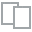
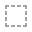
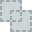
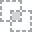
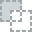
...
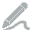
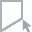
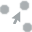
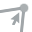
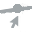

In [80]:
plot_missing(hr_data)

## Discussion
The dataframe is in good order, The data have 1470 records and 35 columns. The columns describe professional properties of individuals; time in a role, time since last promotion, educations, etc. and whether or not they have left the company (attrition).  Several columns recorded as integers were better represented as categoricals.  This will be important when we build plots.
The data were checked for outliers.  Although 

### Outliers
the dataset was filtered  to rows with atleast one outlier, classified as having a z score >3. The z-score measures how many standard deviations a value is from the mean. There are 80 rows with an outlier in atleast one column, no rows have an outlier in every row. The extreme values are interpreted as extreme but likely correct. During model specification it would be prudent to evaluate the sentivity of model health to the inclusion of outliers.

### Data Types
Most columns were correctly classified with the exception of a few categorical columns that were incorrectly specifed as intergers (Job class, salary grade, etc.)

### Missingness
There are no missing values in the dataset.  Imputation is unnecesary.

# Exploratory Data Analysis 

In [ ]:
## Simple Plots

  0%|          | 0/1643 [00:00<?, ?it/s]


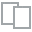
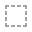
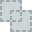
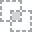
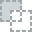
...
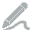
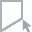
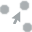
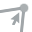
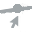

In [79]:
# use data prep package to explore data.
plot(hr_data)

In [207]:
#N=15
#first_n_column  = hr_data.iloc[: , :N]
#sns.pairplot(first_n_column, hue ='Attrition')
#plt.show()

In [211]:
#plt.figure(figsize = (60,60))
#sns.pairplot(hr_data, hue ='Attrition')
#plt.show()

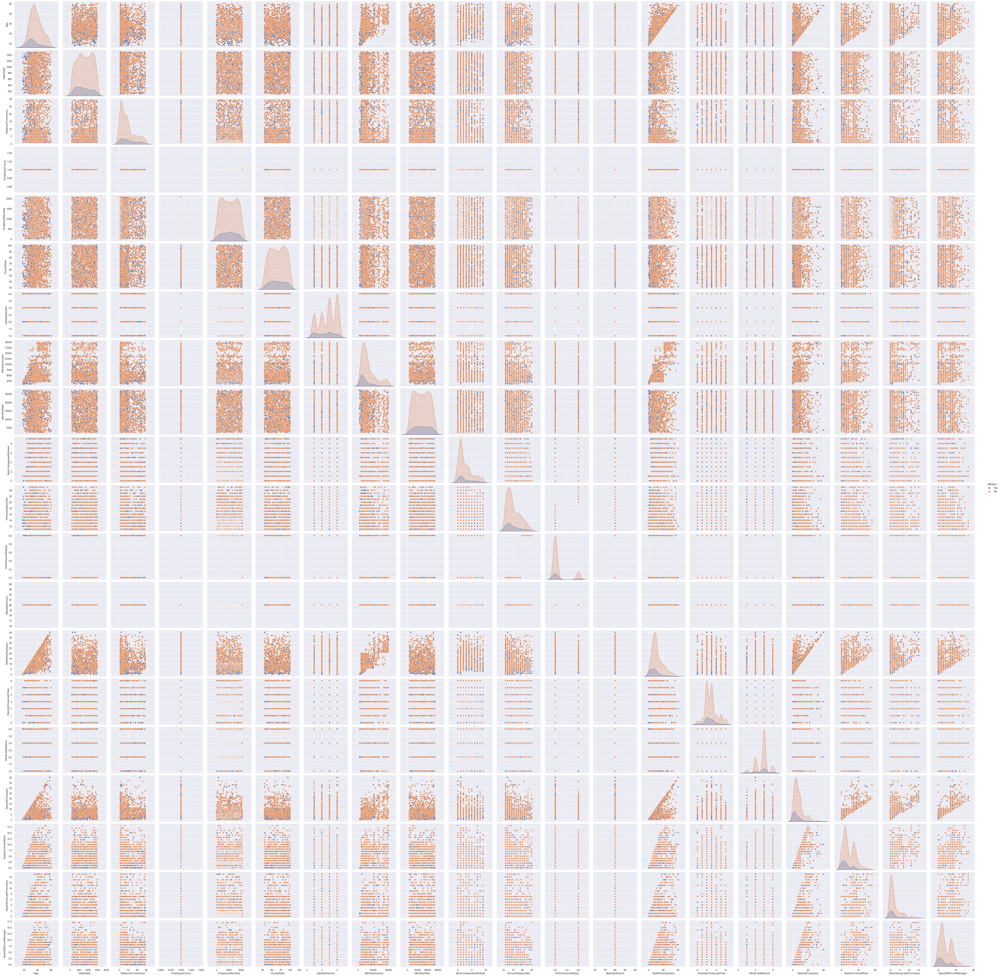

In [199]:
#sns.pairplot(hr_data, hue ='Attrition')
#plt.show()


In [ ]:
## Create an instance of the PairGrid class.
#grid = sns.PairGrid(data= hr_data,
#                    vars = ["Attrition"], size = 4)

In [210]:
corr = hr_data.corr()

corr.style.background_gradient(cmap='coolwarm')

C:\Users\ckitc\anaconda3\lib\site-packages\pandas\io\formats\style.py:2813: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
C:\Users\ckitc\anaconda3\lib\site-packages\pandas\io\formats\style.py:2814: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


,Age,DailyRate,DistanceFromHome,EmployeeCount,EmployeeNumber,HourlyRate,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,StandardHours,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,nan,-0.010145,0.024287,-0.004892,0.497855,0.028051,0.299635,0.003634,0.001904,nan,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,nan,-0.050990,0.023381,0.030571,0.007707,-0.032182,0.038153,0.022704,0.000473,nan,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,nan,0.032916,0.031131,-0.003669,-0.017014,0.027473,-0.029251,0.040235,0.027110,nan,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
EmployeeCount,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
EmployeeNumber,-0.010145,-0.050990,0.032916,nan,1.000000,0.035179,-0.046247,-0.014829,0.012648,-0.001251,-0.012944,-0.020359,nan,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
HourlyRate,0.024287,0.023381,0.031131,nan,0.035179,1.000000,-0.071335,-0.015794,-0.015297,0.022157,-0.009062,-0.002172,nan,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobSatisfaction,-0.004892,0.030571,-0.003669,nan,-0.046247,-0.071335,1.000000,-0.007157,0.000644,-0.055699,0.020002,0.002297,nan,-0.020185,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656
MonthlyIncome,0.497855,0.007707,-0.017014,nan,-0.014829,-0.015794,-0.007157,1.000000,0.034814,0.149515,-0.027269,-0.017120,nan,0.772893,-0.021736,0.030683,0.514285,0.363818,0.344978,0.344079
MonthlyRate,0.028051,-0.032182,0.027473,nan,0.012648,-0.015297,0.000644,0.034814,1.000000,0.017521,-0.006429,-0.009811,nan,0.026442,0.001467,0.007963,-0.023655,-0.012815,0.001567,-0.036746
NumCompaniesWorked,0.299635,0.038153,-0.029251,nan,-0.001251,0.022157,-0.055699,0.149515,0.017521,1.000000,-0.010238,-0.014095,nan,0.237639,-0.066054,-0.008366,-0.118421,-0.090754,-0.036814,-0.110319


##  Observations from corrplot 
The relationship between "soft measurements" of job satisfaction such as "work life balance", "performance", and "work life balance" have no apparent relationship with more measurable properties such as "age", "total years of employment", and "salary".  Time based measurements have the strongest correlations with other time based properties; such as "age", "time with current manager", "years at company", "years in current role", and "years since last promotion".  The realtionships between age and other time based measurements are very reasonable.  

In [189]:
hr_data.groupby(["Attrition"]).size()

Attrition
No     1233
Yes     237
dtype: int64

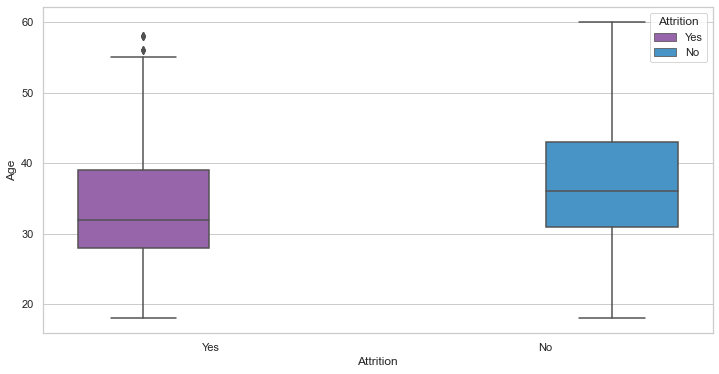

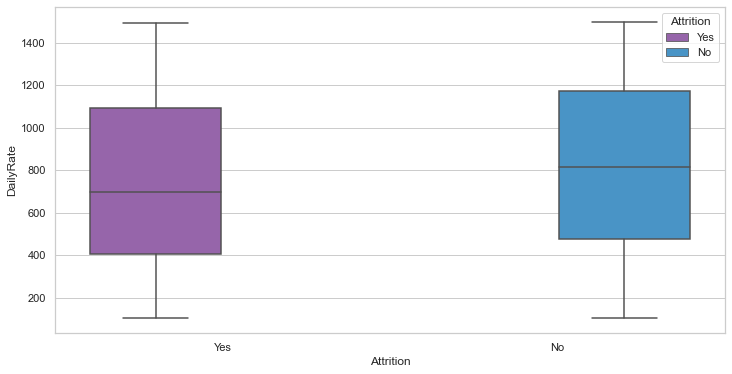

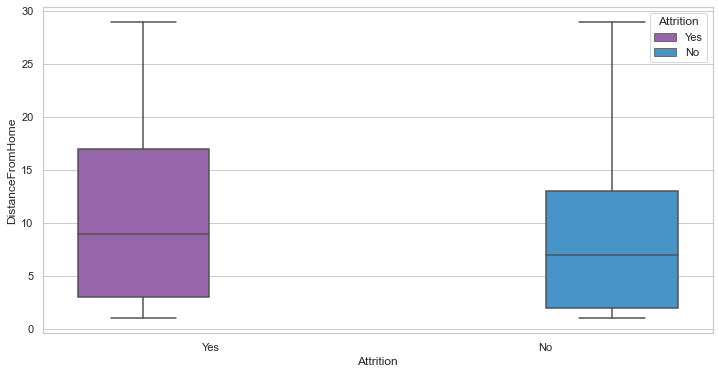

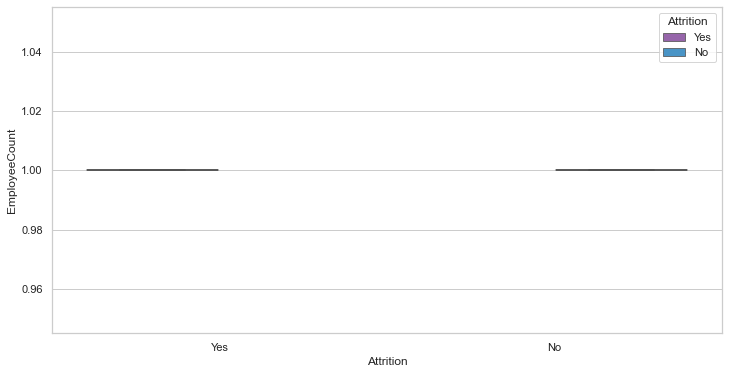

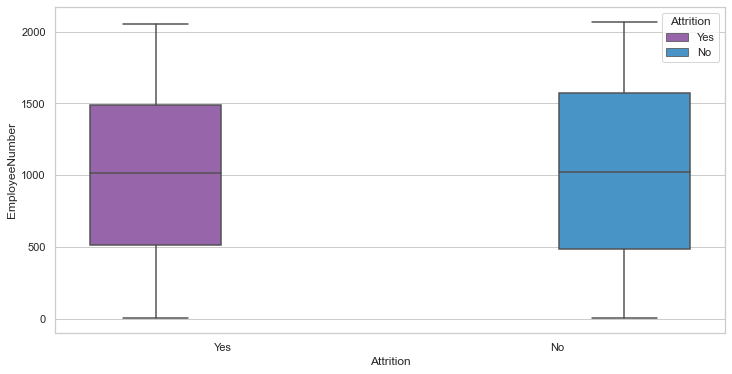

...

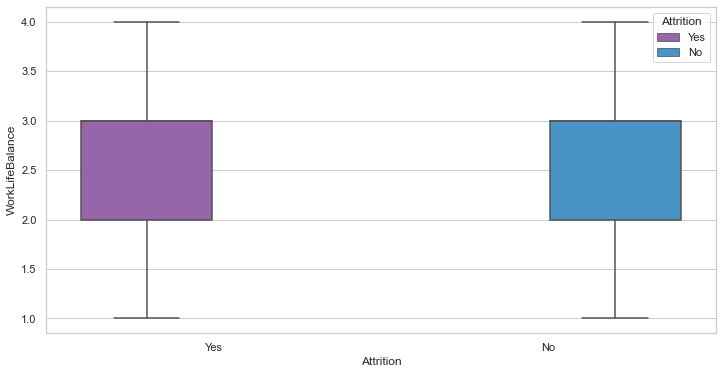

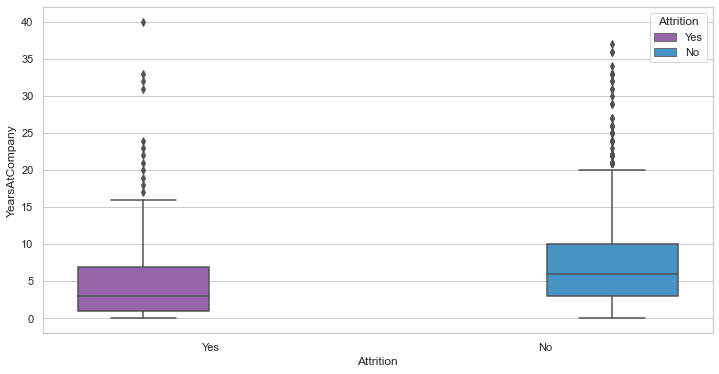

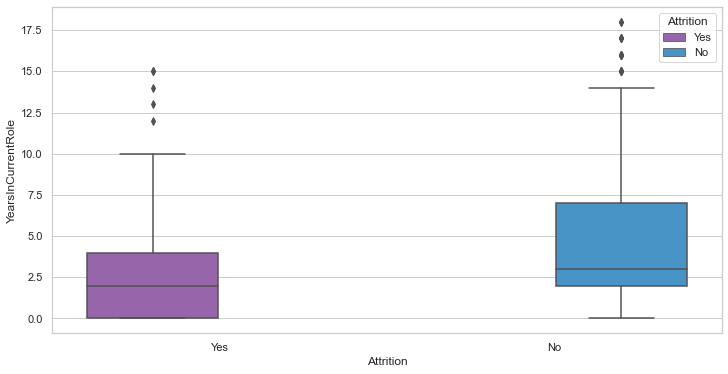

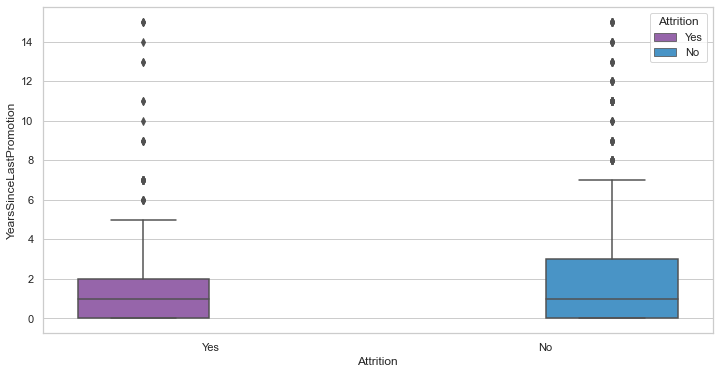

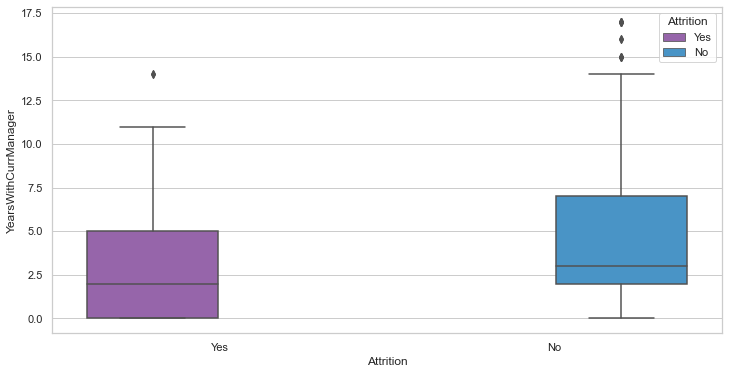

In [156]:
# Plot all of the continuous variables on box plots by our target response variable ("attrition").

import matplotlib.pyplot as plt

my_pal = {"Yes": "#9b59b6", "No": "#3498db"}

numeric_data = hr_data.select_dtypes(include='number')
sns.set(style="whitegrid")

for i, col in enumerate(numeric_data.columns):
    plt.figure(i)
    sns.boxplot(y=col,x="Attrition", data=raw_data, hue="Attrition", palette=my_pal)

## Observations from Exploratory Boxplots

Based on visual inspection without conducting statistical tests the following trends are apparent in the boxplots:
1. On average younger people attrite
2. Employees who attrite make less than those who stay (monthly). Likely due to the relationship between age and salary.
3. Employees who attrite live further from work
4. Job satisfaction is much lower in employees who attrite.
5. Resigning employees have fewer years of total experience than those who remain.
6. No apparent difference in work life balance.
7. Years since last promotion has some extreme outliers in the attrition group.  



In [185]:
#example plot, before setting up for loop
#sns.countplot(x="Attrition", data=hr_data, hue="Attrition", palette=my_pal)

In [188]:


#sns.countplot(x="Attrition", data=hr_data, hue="Attrition", palette=my_pal)

## Countplots by attrition group

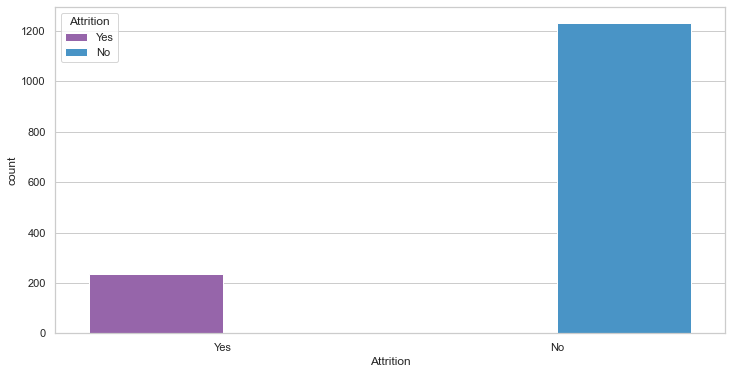

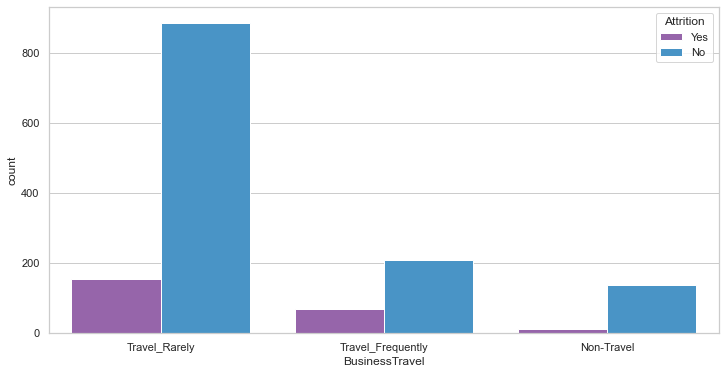

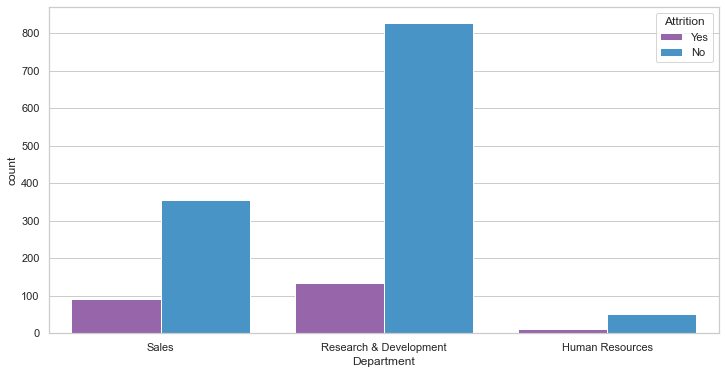

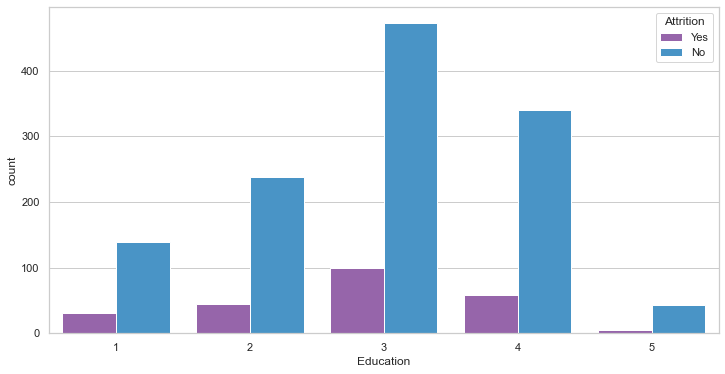

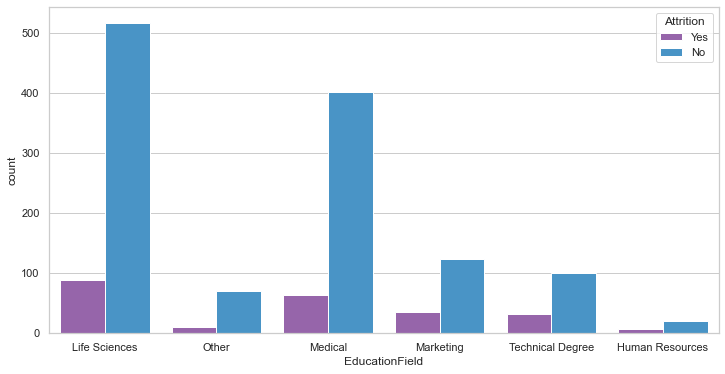

...

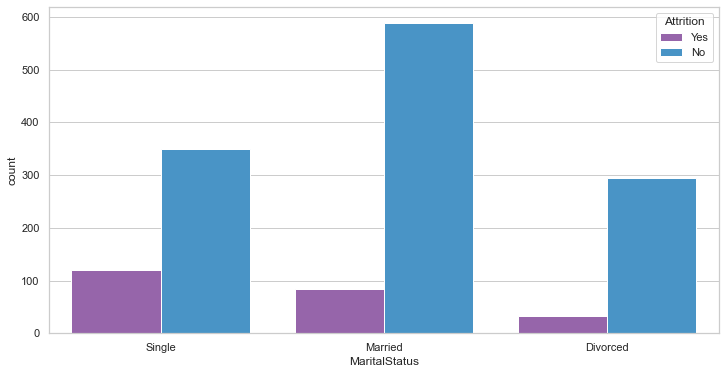

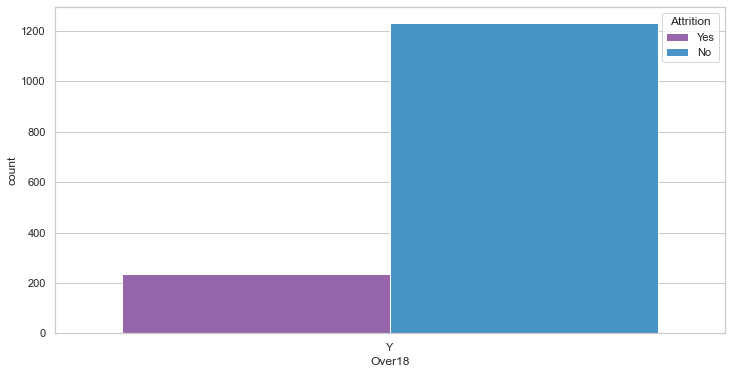

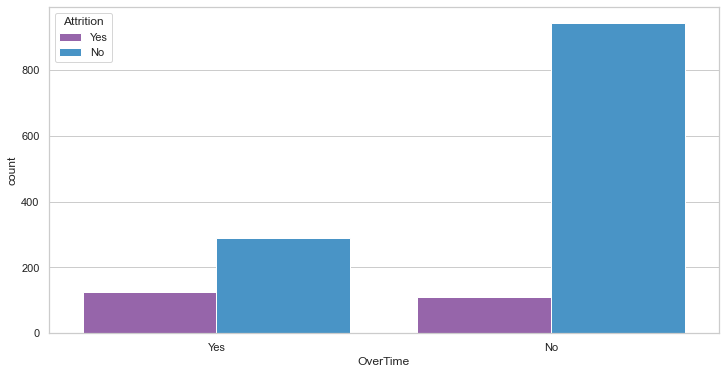

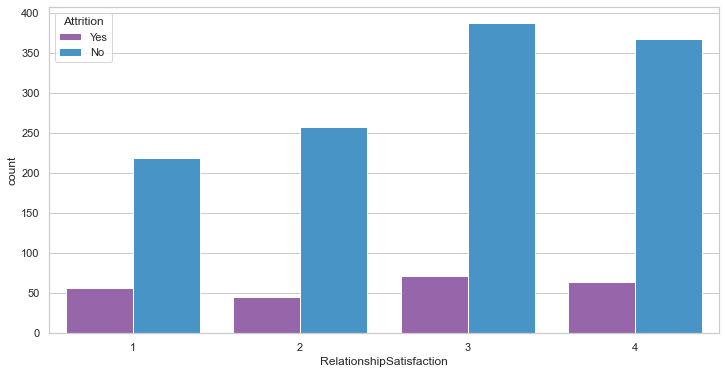

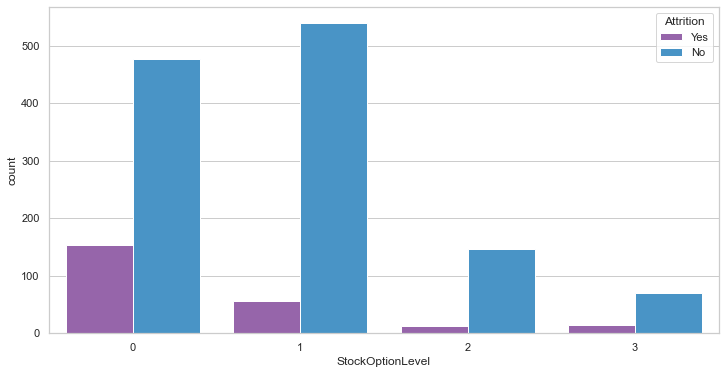

In [157]:
# look at count plots to determine which groups have the most individuals attrite.

categorical = hr_data.select_dtypes(exclude=['int64'])

for i, col in enumerate(categorical.columns):
    
    plt.figure(i)
    total=float(len(hr_data))
    #sns.set(rc = {'figure.figsize':(12,6)})

    ax=sns.countplot(x=col, data=raw_data, hue="Attrition", palette=my_pal)
  
    

## Observations from Count Plots

We will examine the countplots expressed as percents but first we will examine countplots for categorical variables divided by attrition status.

Observations:
1. 237 of 1233 employees have resigned (20%).  We don't know the time period that the data were collected over.
2. The most people who attrite travel rarely but it looks to be a smaller proportion than those who travel frequently. 
3. The most people who attrite are in R&D
4. Most of the people who attrite have a >= level 3 of Education.
5. Highest number of attriting individuals in life sciences
6. People who leave are mostly male
7. Most of the poeple who leave are in a level 1 role.  Most people who attrite are early career.
8.  Most of the people who attrite are single (count and percentage). This is likely related to age.
9. Most of the people who resign have no stock options.

Many of these relationships although true may not be representative when we rexamine attrition as a percent of each of the categorical variables. 






In [183]:
#test=(categorical
#.groupby('MaritalStatus')['Attrition']
#.value_counts(normalize=True)
#.mul(100)
#.rename('percent')
#.reset_index())
# 
#print(test.head())
##sns.catplot(test, x='MaritalStatus',y='percent',hue='Attrition',kind='bar',palette=my_pal)
#sns.barplot(x="MaritalStatus",y="percent", data=test, hue="Attrition", palette=my_pal)

## Barplots as a Percentage

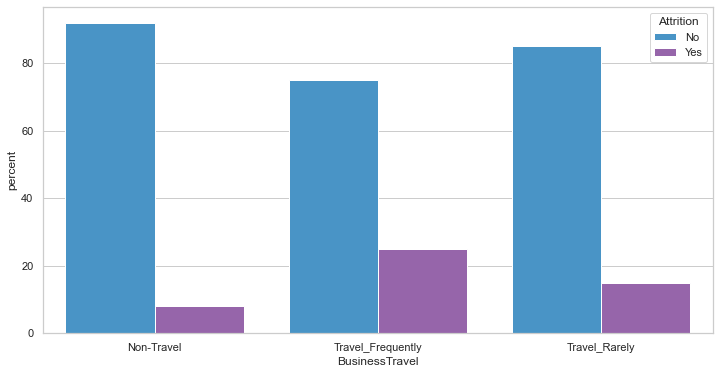

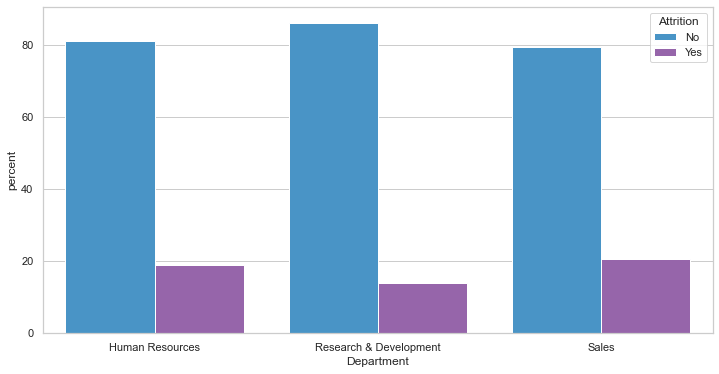

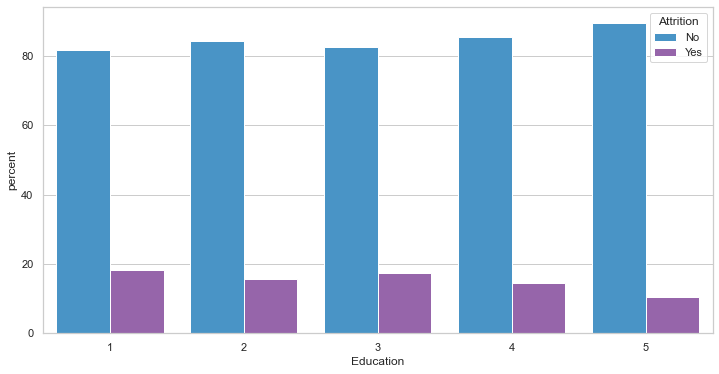

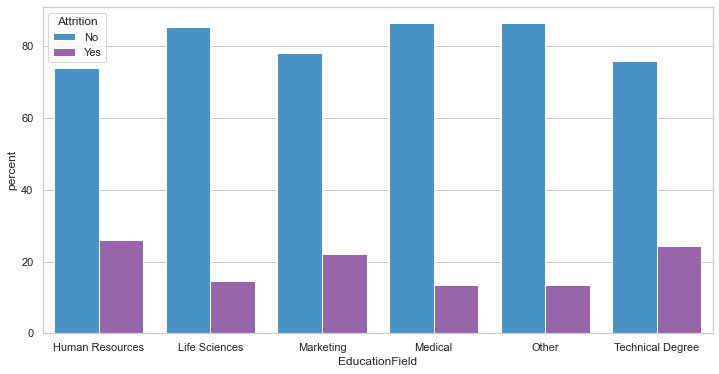

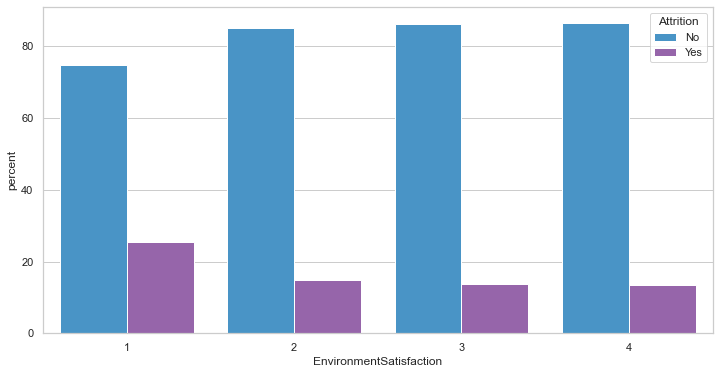

...

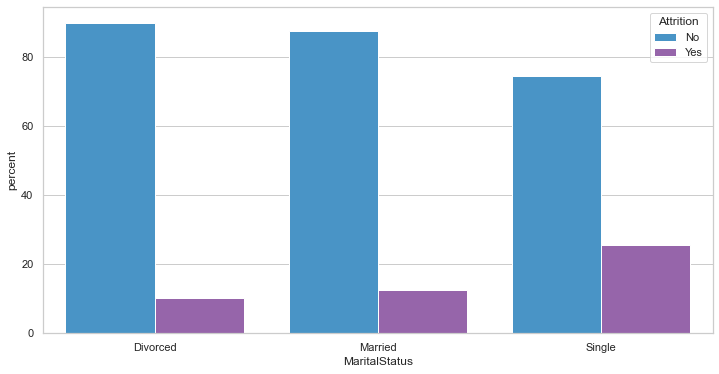

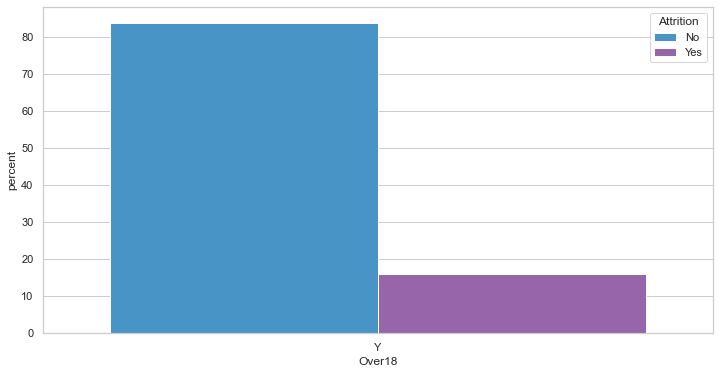

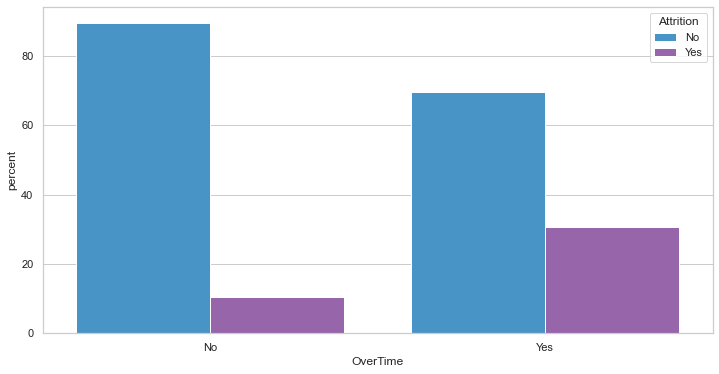

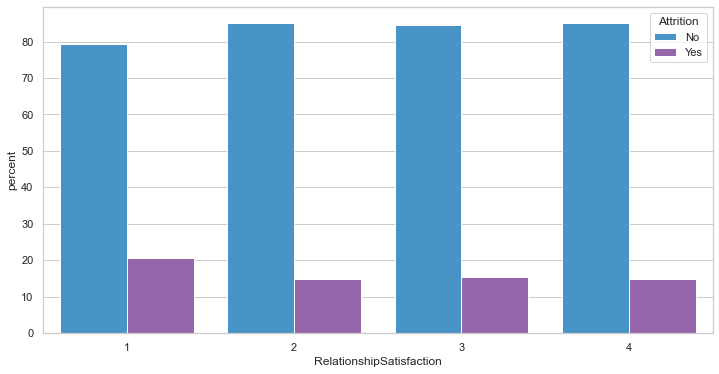

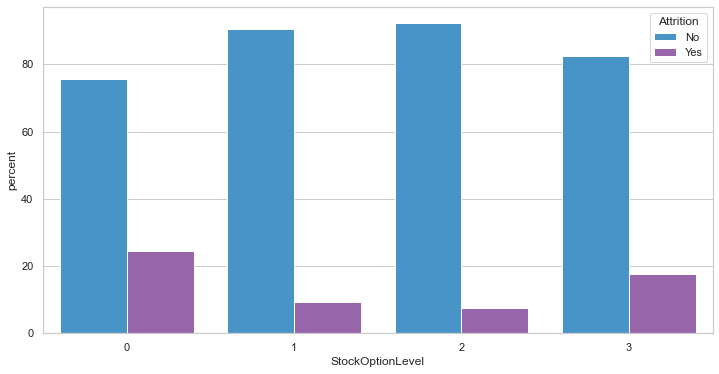

In [176]:
# Create Barplot of proportion of each categorical vaiable that has ATTRITED or REMAINED.

categorical = hr_data.select_dtypes(exclude=['int64'])

for i, col in enumerate(categorical.columns.drop("Attrition")):
    test=(categorical
    .groupby(col)['Attrition']
    .value_counts(normalize=True)
    .mul(100)
    .rename('percent')
    .reset_index())
 
    plt.figure(i)
    #sns.set(rc = {'figure.figsize':(12,6)})

    ax=sns.barplot(x=col,y='percent', data=test, hue='Attrition', palette=my_pal)

    


## Observations from Count Plots
For the same categorical variables as above we wille examine the percent of each variable by attrition group.

Observations from these figures:

Attrition is highest for employees that:

1) travel frequently
2) in sales (stable accroess disciplines)
3) Education level 1
4) Human resources, Marketing, and people with technical degrees
5) have low enviroment satisfaction (1)
6) Males (slightly, maybe not statistically significant)
7) low job involvement (30+ % attrition)
8) have a low job level
9) Sales Representatives (40%)
10) are single
11) Who work overtime
12) Have a low relationship satisfaction
13) Don't have stock options




## Boxplots of Categoricals vs Salary

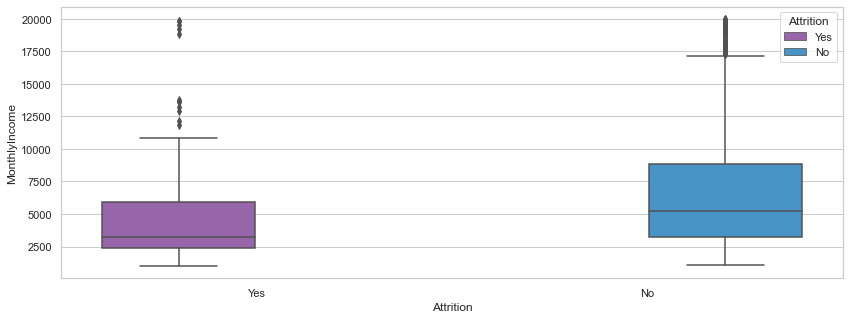

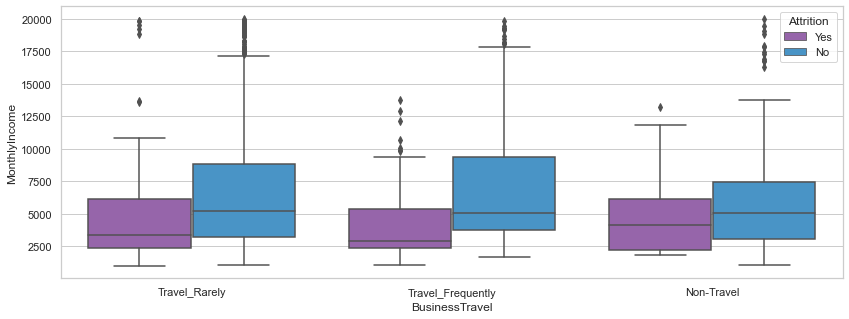

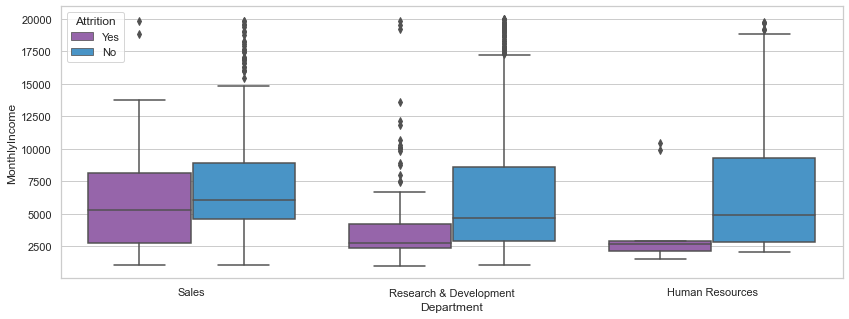

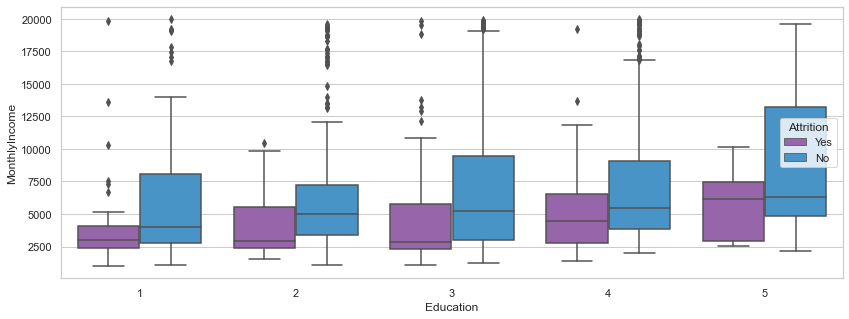

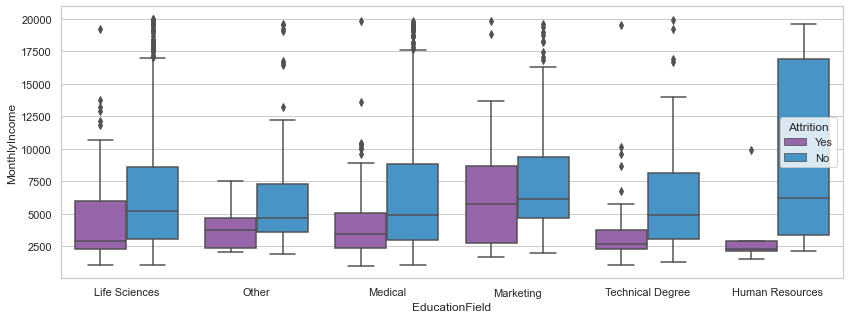

...

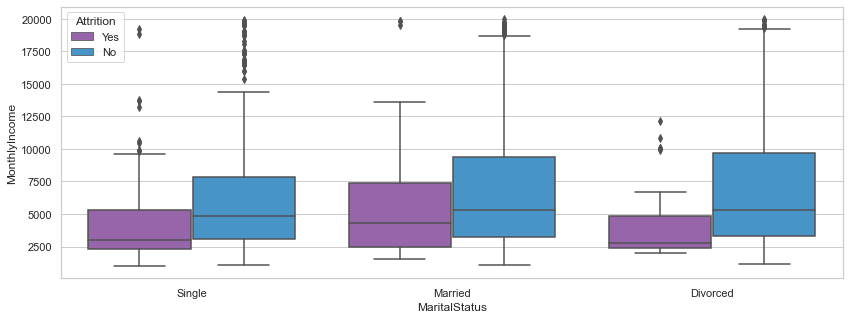

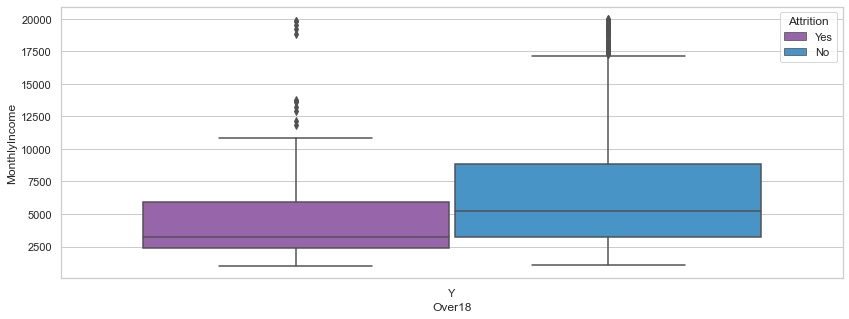

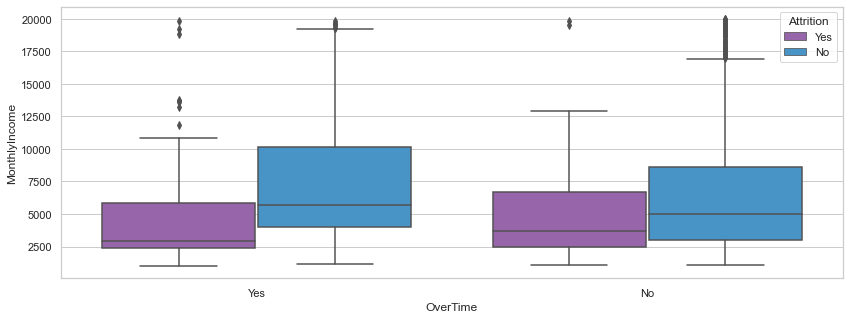

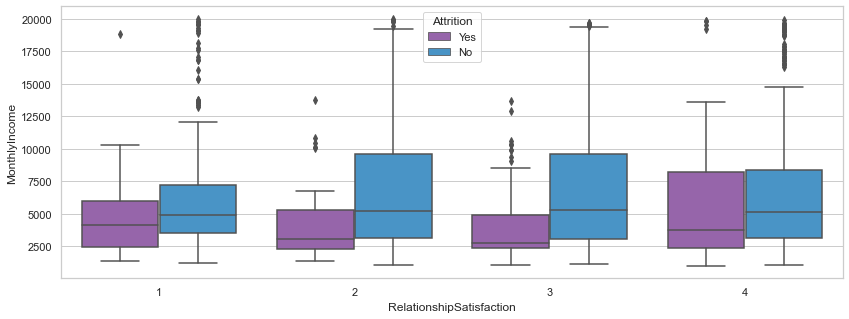

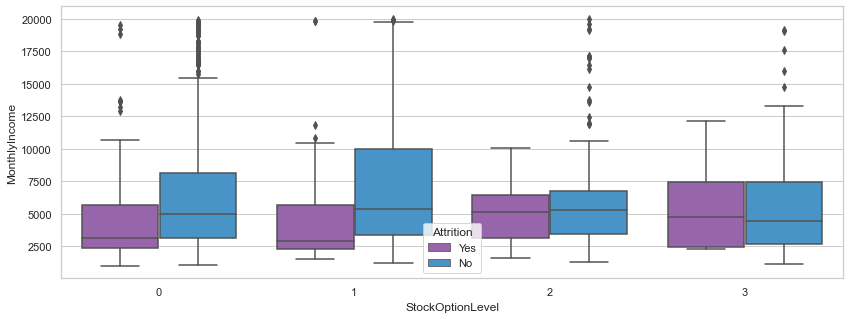

In [216]:
#Analyze Salary within each category.


import matplotlib.pyplot as plt

#categorical
sns.set(rc = {'figure.figsize':(14,5)})
sns.set(style="whitegrid")

for i, col in enumerate(categorical.columns):
    plt.figure(i)
    sns.boxplot(y="MonthlyIncome",x=col, data=raw_data, hue="Attrition", palette=my_pal)


### Observations from Salary countplots

## Boxplots of Categoricals vs Age

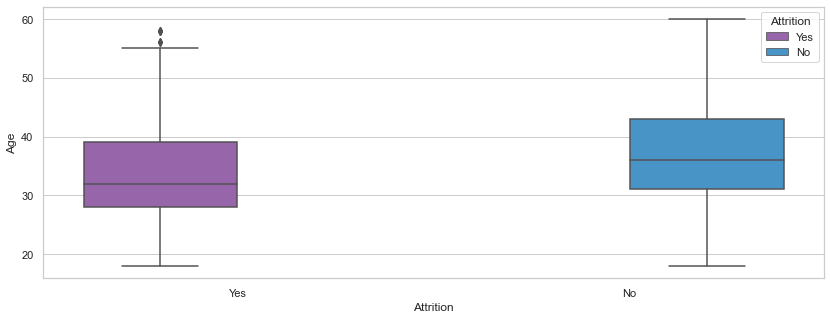

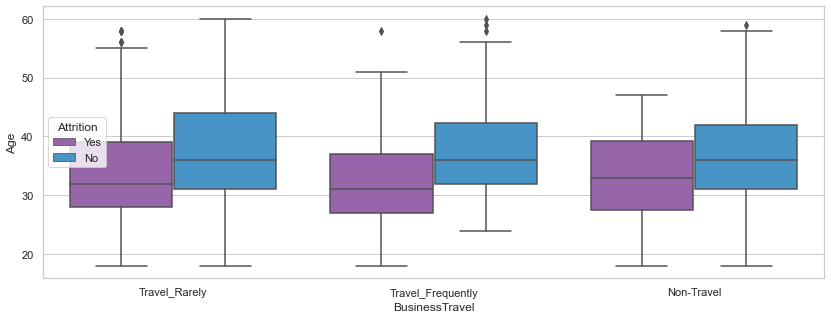

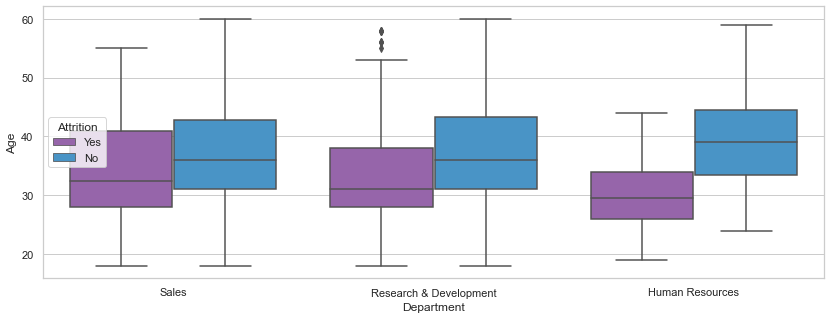

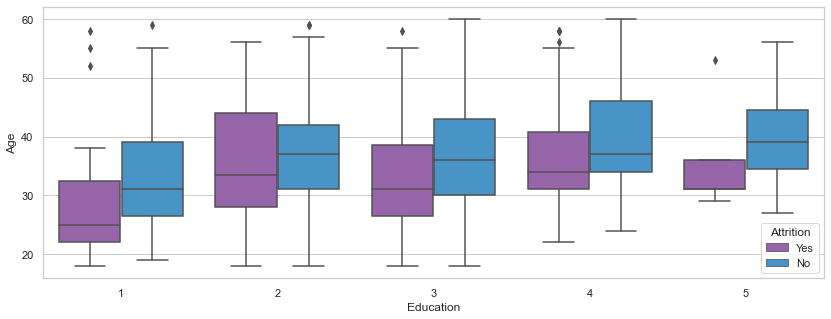

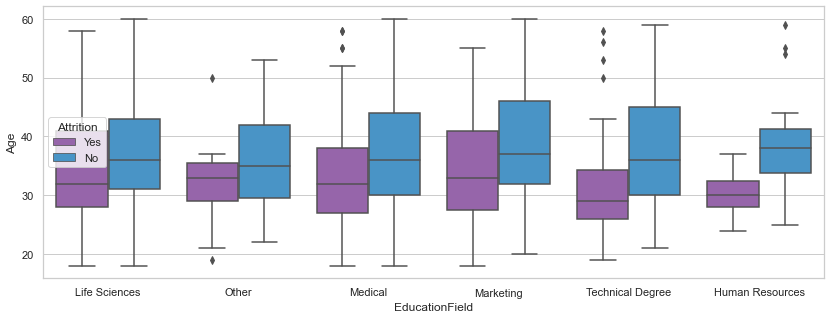

...

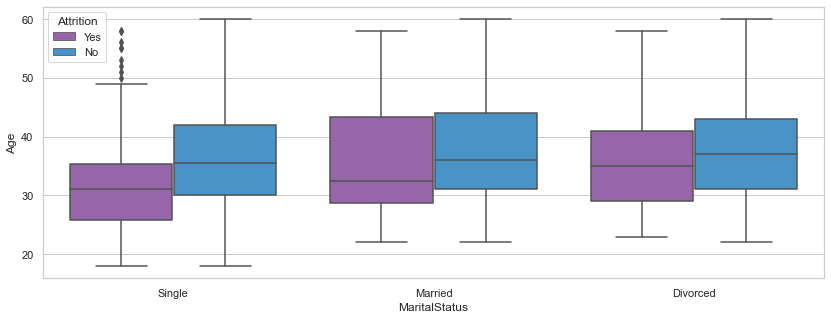

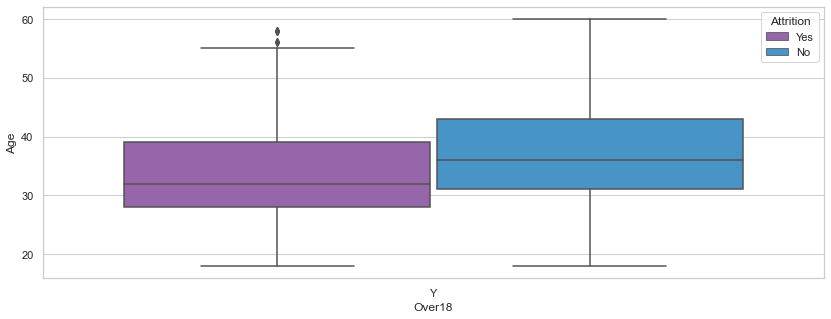

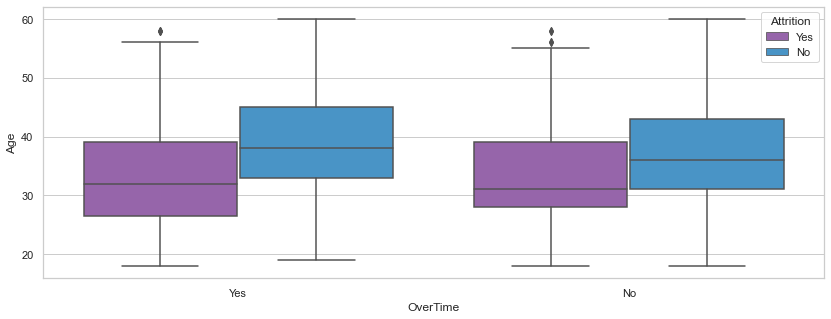

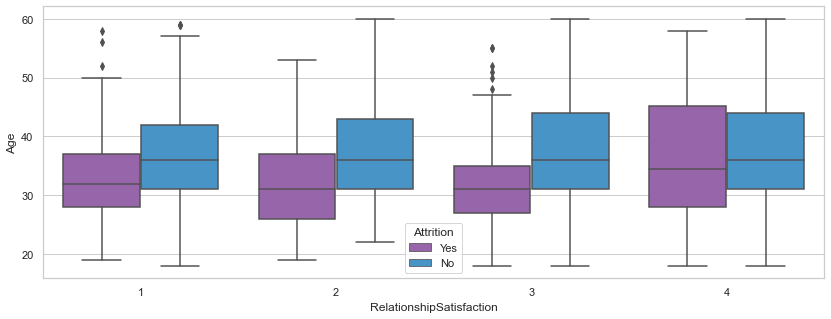

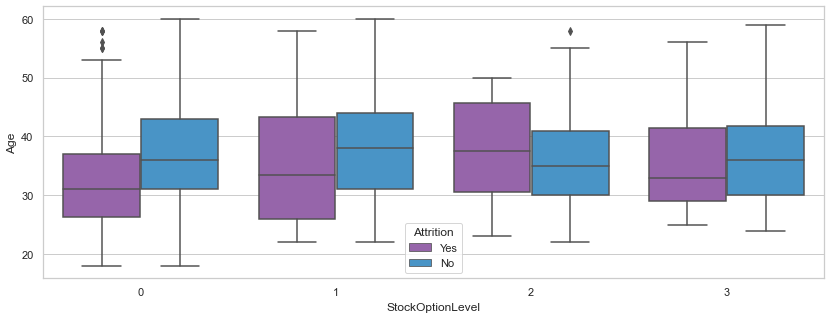

In [217]:
#Analyze AGE within each category.



#categorical
sns.set(rc = {'figure.figsize':(14,5)})
sns.set(style="whitegrid")

for i, col in enumerate(categorical.columns):
    plt.figure(i)
    sns.boxplot(y="Age",x=col, data=raw_data, hue="Attrition", palette=my_pal)

### Observations from AGE countplots

## Boxplots of Categoricals vs DISTANCE FROM HOME

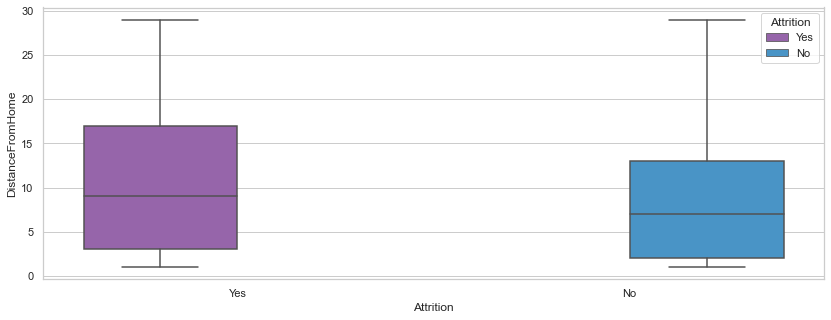

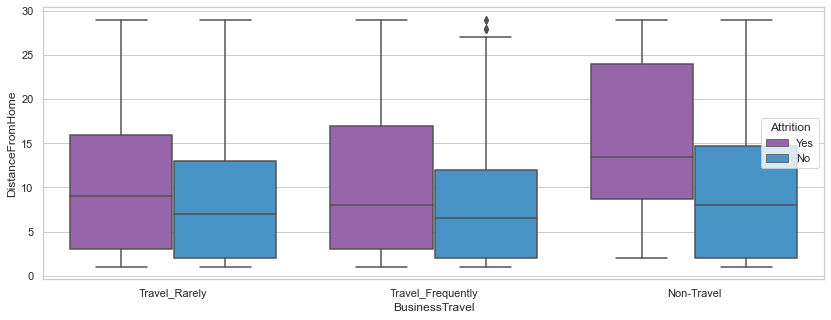

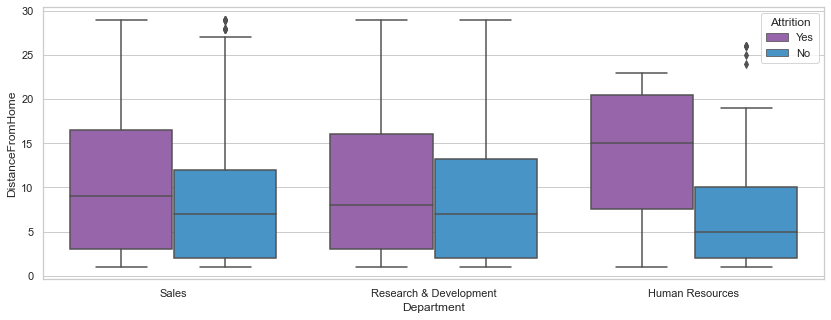

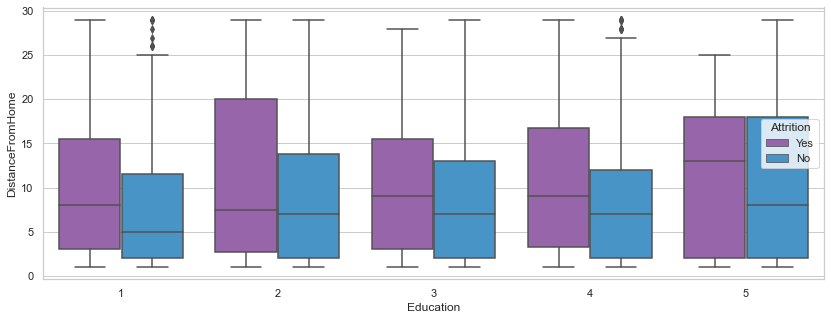

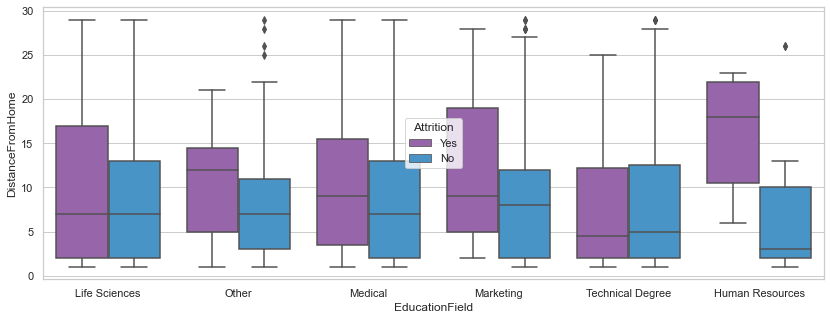

...

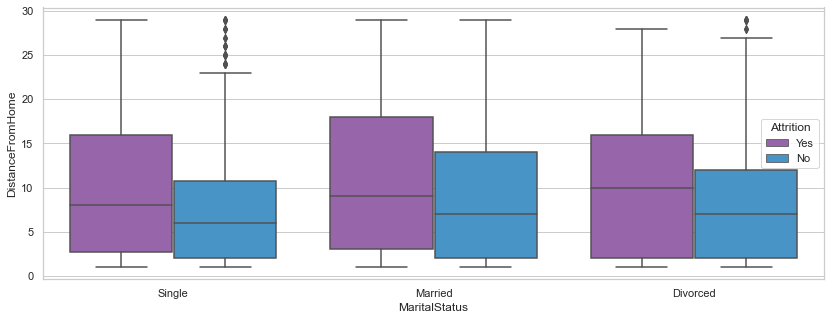

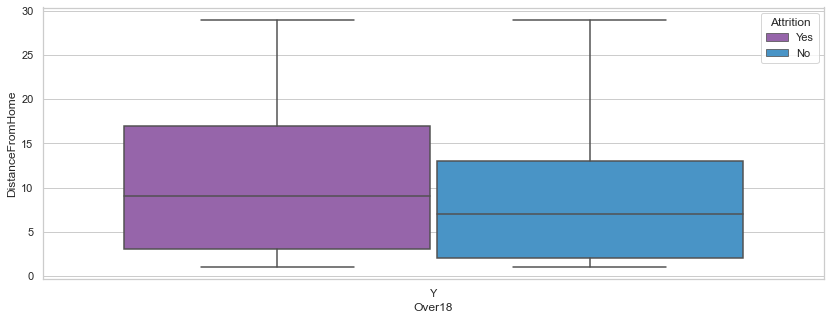

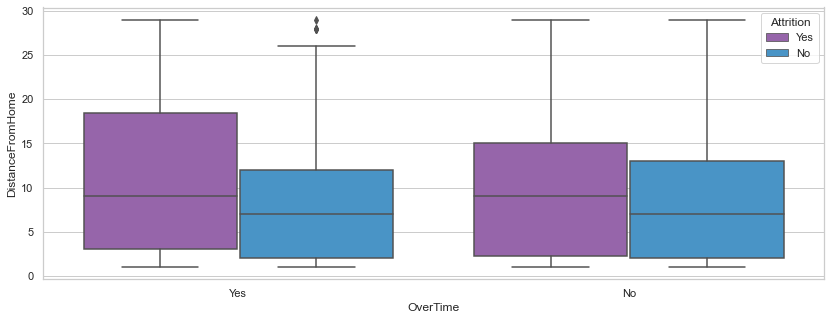

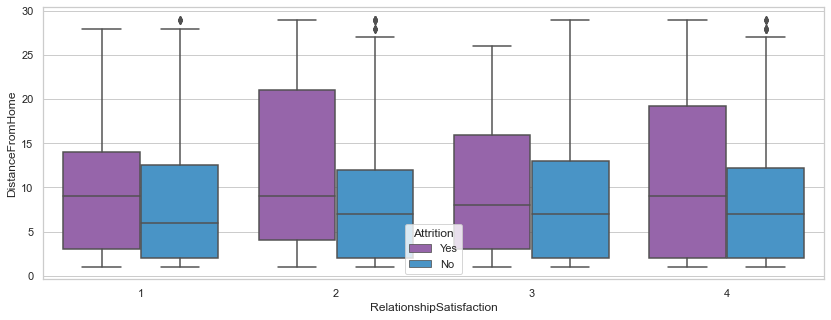

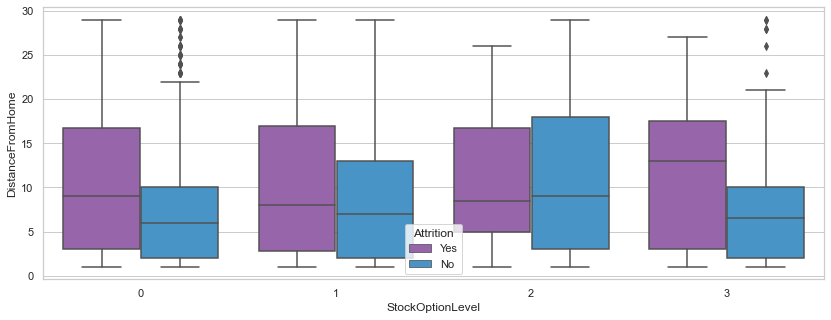

In [218]:

#categorical
sns.set(rc = {'figure.figsize':(14,5)})
sns.set(style="whitegrid")

for i, col in enumerate(categorical.columns):
    plt.figure(i)
    sns.boxplot(y="DistanceFromHome",x=col, data=raw_data, hue="Attrition", palette=my_pal)

### Boxplots of categoricals vs DISTANCE

## Parallel Plot of continuous variables colored by attrition

In [223]:
# Make the plot
import pandas
import matplotlib.pyplot as plt
from pandas.tools.plotting import parallel_coordinates
parallel_coordinates(numeric_data,  colormap=plt.get_cmap("Set2"))
plt.show()

ModuleNotFoundError: No module named 'pandas.tools'

In [ ]:
radar plots by means

Additional questions:
    Which gender has the highest attrition
    Which Role has the highest % attrition
    Salary by department and role
    Analyze the properties of people who are sales representatives (v high attrition) 
    Analyze the people who attrite that have stock option 3 (stale?)
    Are we dsitinguishing between retirements and attrition?
    

In [ ]:
Add outlier boxplots